In [1]:
import os
from pathlib import Path
import requests
from tqdm import tqdm
from typing import Union, List

import math
import torch
import numpy as np
import audiotools
import dasp_pytorch
import auraloss
# import laion_clap
from audiotools import AudioSignal

from transformers import BertForMaskedLM

from scipy import signal
import matplotlib.pyplot as plt
%matplotlib inline

NOTEBOOKS_DIR = Path(os.path.abspath(''))
PROJECT_DIR = NOTEBOOKS_DIR.parent
ASSETS_DIR = PROJECT_DIR / "assets"
PRETRAINED_DIR = PROJECT_DIR / "pretrained"
DATA_DIR = PROJECT_DIR / "data"
RUNS_DIR = PROJECT_DIR / "runs"
EXPERIMENTS_DIR = PROJECT_DIR / "experiments"
EXP_AUDEALIZE_DIR = EXPERIMENTS_DIR / "audealize_comp"

In [2]:
def load_examples(dir_path):
    exts = ["mp3", "wav", "flac"]
    example_files = [list(dir_path.rglob(f"*.{e}")) for e in exts]
    example_files = sum(example_files, [])  # Trick to flatten list of lists
    return example_files

def find_paths_with_keyword(file_paths, keywords, returnSingle=False):
    """
    Find paths containing all given keywords.
    
    Args:
    - file_paths (list of str or PosixPath): List of file paths to search.
    - keywords (list of str): List of keywords to search for.
    - return_single (bool): If True, return only the first match. If False, return a list of all matches.
    
    Returns:
    - str or list of str: Single path or list of paths matching the keywords.
    """
    if returnSingle:
        return next((file for file in file_paths if all(keyword in str(file) for keyword in keywords)), None)
    else:
        return [file for file in file_paths if all(keyword in str(file) for keyword in keywords)]

def load_and_find_path_with_keyword(dir_path, keywords, returnSingle=False):
    """
    Search for files given a folder (can be nested) and multiple keywords.
    
    Args:
    - dir_path (str or PosixPath): Parent directory to pull all audio files from.
    - keywords (list of str): List of keywords to search for.
    - return_single (bool): If True, return only the first match. If False, return a list of all matches.
    
    Returns:
    - str or list of str: Single path or list of paths matching the keywords.
    """
    examples_all = load_examples(dir_path)
    return find_paths_with_keyword(examples_all, keywords, returnSingle=returnSingle)


/home/annie/research/text2fx/assets/audealize_examples/guitar.wav



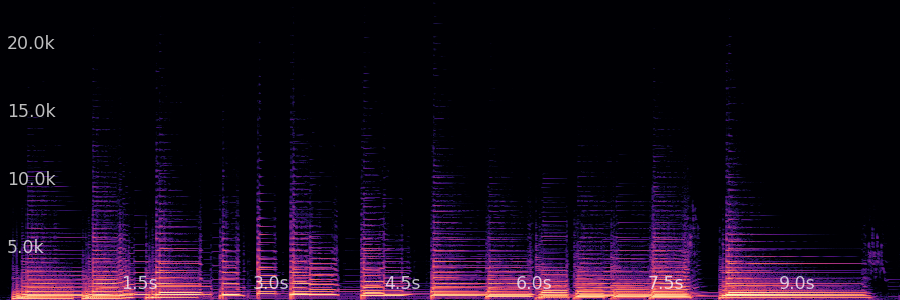
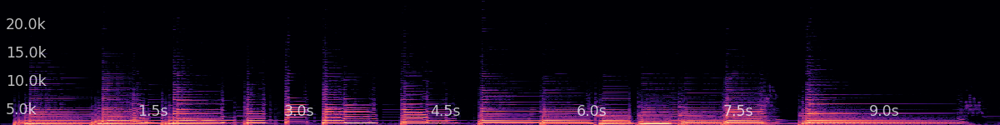

duration: 10.243 seconds
batch_size: 1
path: /tmp/tmpjcyhhopm.wav
sample_rate: 44100
num_channels: 2
audio_data.shape: torch.Size([1, 2, 451714])
stft_params: STFTParams(window_length=2048, hop_length=512, window_type='hann', match_stride=False, padding_type='reflect')
device: cpu



In [3]:
input_raw_guitar = load_and_find_path_with_keyword(ASSETS_DIR, ["guitar"], returnSingle=True)
print(input_raw_guitar)
input_sig_guitar = AudioSignal(input_raw_guitar)
input_sig_guitar.widget()
print(input_sig_guitar)

### parametric EQ via scipy? 

In [4]:
# TO DO: FIX GAIN NORMALIZATION STUFF, LOOK AT BIQUAD IN DASP_PYTORCH.SIGNAL.BIQUAD()
#-- single filter different gain applications for 2nd order filters, diff from paramEQ audealize tho
def apply_peak_filter(x, f0, gain_db, Q=4.31, fs=44100):
    """
    x = signal as 1D np.array
    f0 = frequency
    gain = in db
    returns filtered_signal as 1D np.array
    """
    b, a = signal.iirpeak(f0, Q, fs)     # Design peak filter

    filtered_signal = signal.lfilter(b*gain_db, a, x)     # Apply the filter to the signal

    return filtered_signal# + x #should it just be filtered_signal?

In [5]:
# -- single filter different gain applications for 2nd order filters, diff from paramEQ audealize tho
# TO DO: FIX GAIN NORMALIZATION STUFF, LOOK AT BIQUAD IN DASP_PYTORCH.SIGNAL.BIQUAD()
def apply_multiple_filters(x, fs, filters, Q=4.31):
    """
    x = signal as 1D np.array
    filters = list of (frequency, gain_db) pairs
    fs = should be fs of x
    returns filtered_signal as 1D np.array
    """
    # filtered_signal = x.copy()  # Make a copy of the original signal
    filtered_signal = np.zeros_like(x)  # Initialize the filtered signal with zeros

    f_resp = []
    for f0, gain_db in filters:
        b, a = signal.iirpeak(f0, Q, fs)         # Design peak filter
        # gain_con = 	10**(gain_db/40)
        # b  *= gain_con         # Design peak filter
        
        #checking
        freq, h = signal.freqz(b, a, fs=fs)
        f_resp.append((freq,h))

        # a0 = 1 + (alpha / A)
        # b = b.type_as(gain_db) / a0
        # a = a.type_as(gain_db) / a0
    
        # Apply the filter to the signal
        filtered_signal += signal.lfilter(b, a, x)

    return filtered_signal, f_resp

### parametric EQ via DASP

In [6]:
# DASP 
# NOTE: looks like it can only do mono, adapt for stereo?
def dasp_apply_multiple_filters(x, fs, filters, Q=4.31):
    """
    x (input signal) = MONO ONLY, torch tensor of samples, if audiosignal, set to AudioSignal.samples 
                        shape is (bs, n_channels, signals)
                        ex torch.Size([1, 1, 451714])
    filters = list of (frequency, gain_db) pairs
    fs = should be fs of x
    returns filtered signal as (bs, n_channels, signals)
    """
    filtered_signal = x.clone()  # Make a copy of the original signal

    f_resp = []
    Q = torch.tensor(Q)
    for f0, gain_db in filters:
        b, a = dasp_pytorch.signal.biquad(gain_db*5, f0, Q, fs, 'peaking')         # Design peak filter
        filtered_signal = dasp_pytorch.signal.lfilter_via_fsm(filtered_signal, b, a)

    return filtered_signal

In [7]:
## testing warm
freq_bands = [20, 50, 83, 120, 161, 208, 259, 318, 383, 455, 537, 628, 729, 843, 971, 
              1114, 1273, 1452, 1652, 1875, 2126, 2406, 2719, 3070, 3462, 3901, 
              4392, 4941, 5556, 6244, 7014, 7875, 8839, 9917, 11124, 12474, 13984, 
              15675, 17566, 19682]

warm_gain =  [0.803050289563287, 0.9271671229899398, 1.0324708328031769, 1.0351144573373676, 0.986854460272695, 0.9135617558240603, 0.831665652735118, 0.7468186220959449, 0.565402240166215, 0.30486795755474, 0.047888151448409785, -0.13102634603825192, -0.255612704341972, -0.3503611291019008, -0.44080369718786294, -0.5113786811768023, -0.5718710124266386, -0.6079463071416481, -0.5562781287534648, -0.44205631942801077, -0.35277907653206814, -0.3283586193864538, -0.33364933411501685, -0.3308065132663487, -0.3027133884882681, -0.2505545095697583, -0.21840342693117296, -0.21025695438020822, -0.22051281648917276, -0.21730346426406427, -0.21898817081223199, -0.2226530013315962, -0.189054009380673, -0.11702422499893432, -0.04732670847110778, -0.04317309457341804, -0.10640752926339152, -0.16201275113839303, -0.20842208537933848, -0.2595718709375339]

warm_freq_gains = list(zip(freq_bands, warm_gain))

tensor_warm_freq_gains = [(torch.tensor([freq]), torch.tensor([gain])) for freq, gain in warm_freq_gains]
# tensor_warm_freq_gains

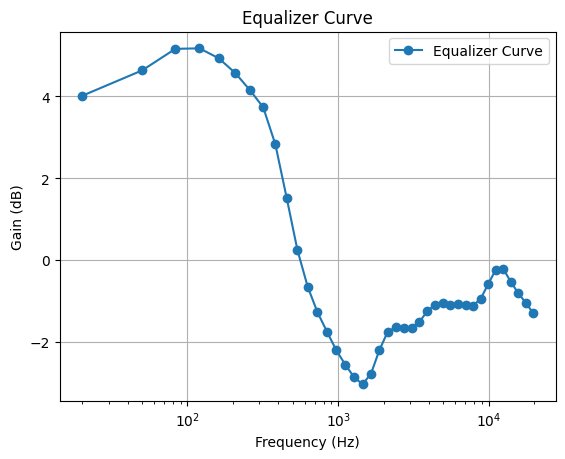

In [8]:
def plot_eq_curve(freq_bands, gains):
    """
    Plots the frequency response of the equalizer.
    
    Args:
    - freq_bands: List of center frequencies of the filters.
    - gains: List of gain values for each filter.
    """
    freq_bands = np.array(freq_bands)
    gains = np.array(gains)*5
    
    plt.semilogx(freq_bands, gains, label='Equalizer Curve', marker='o')
    
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Gain (dB)')
    plt.title('Equalizer Curve')
    plt.legend()
    plt.grid(True)
    plt.show()

plot_eq_curve(freq_bands, warm_gain)

Audealize effected signal ... ground truth...



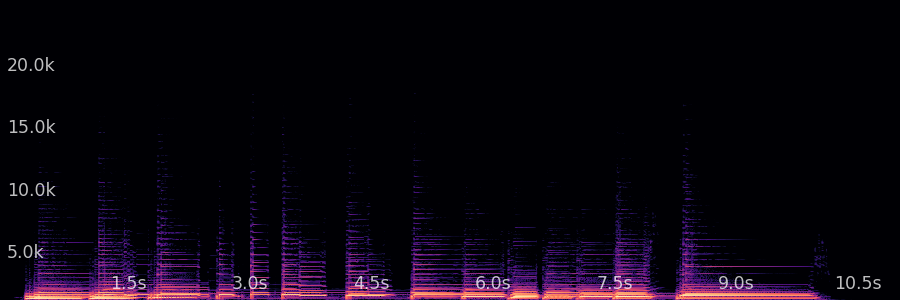
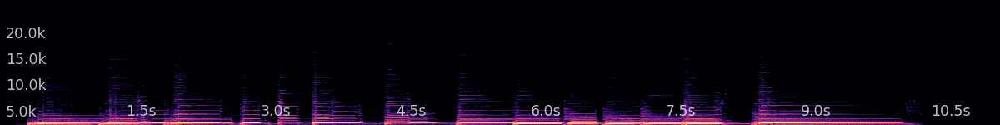

duration: 11.107 seconds
batch_size: 1
path: /tmp/tmpbxh3kzjk.wav
sample_rate: 48000
num_channels: 2
audio_data.shape: torch.Size([1, 2, 533120])
stft_params: STFTParams(window_length=2048, hop_length=512, window_type='hann', match_stride=False, padding_type='reflect')
device: cpu



In [9]:
#loading audealize ground truth, recorded out of laptop
aud_gnd_truth = load_and_find_path_with_keyword(EXP_AUDEALIZE_DIR, ["gnd"], returnSingle=True)
aud = AudioSignal(aud_gnd_truth)
print("Audealize effected signal ... ground truth...")
aud.widget()
print(aud)

clean signal...



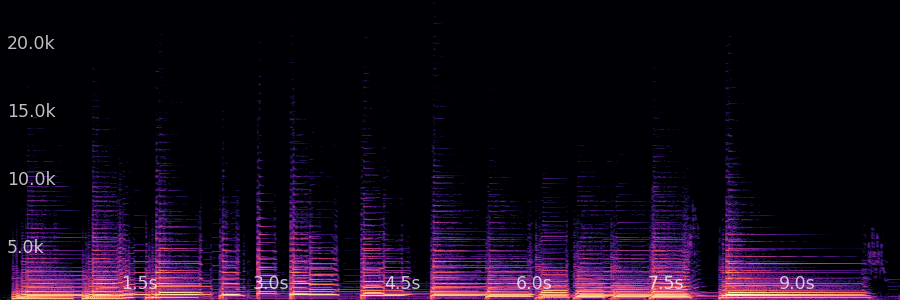
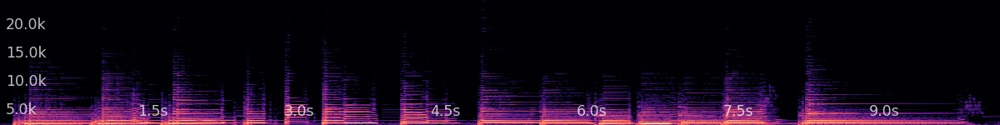

duration: 10.243 seconds
batch_size: 1
path: /tmp/tmpkpy6fft5.wav
sample_rate: 44100
num_channels: 1
audio_data.shape: torch.Size([1, 1, 451714])
stft_params: STFTParams(window_length=2048, hop_length=512, window_type='hann', match_stride=False, padding_type='reflect')
device: cpu

DIY effected signal ... post 40band paramEQ...


/home/annie/miniconda3/envs/css_wespeaker/lib/python3.9/site-packages/audiotools/core/audio_signal.py:601: UserWarning: Audio amplitude > 1 clipped when saving
  warnings.warn("Audio amplitude > 1 clipped when saving")



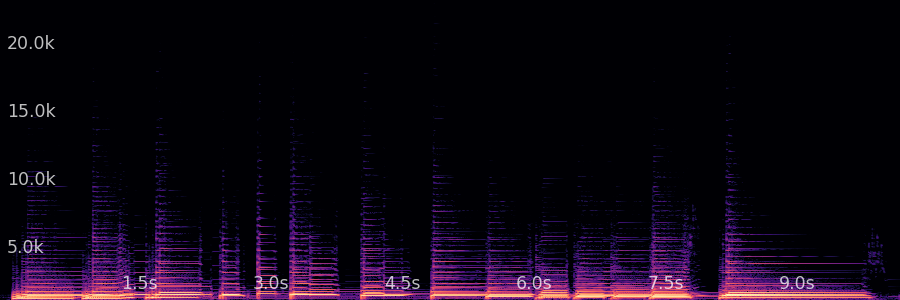
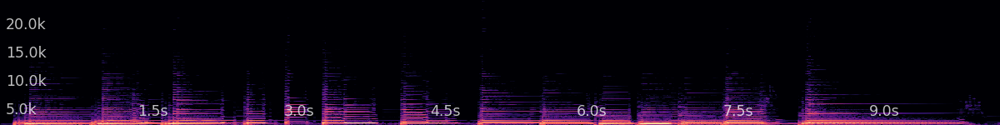

duration: 10.243 seconds
batch_size: 1
path: /tmp/tmpyos0ft52.wav
sample_rate: 44100
num_channels: 1
audio_data.shape: torch.Size([1, 1, 451714])
stft_params: STFTParams(window_length=2048, hop_length=512, window_type='hann', match_stride=False, padding_type='reflect')
device: cpu



In [10]:
# Original Input
input_raw_guitar = load_and_find_path_with_keyword(ASSETS_DIR, ["guitar"], returnSingle=True)
input_sig_guitar = AudioSignal(input_raw_guitar).to_mono()
print("clean signal...")
input_sig_guitar.widget()
# print(input_sig_guitar)

# EQ-ed output
filtered_sig = dasp_apply_multiple_filters(input_sig_guitar.samples,input_sig_guitar.sample_rate, tensor_warm_freq_gains)
filter_out = AudioSignal(filtered_sig,input_sig_guitar.sample_rate)

print("DIY effected signal ... post 40band paramEQ...")
filter_out.widget()
# print(filter_out)

 Output: DIY EQed 



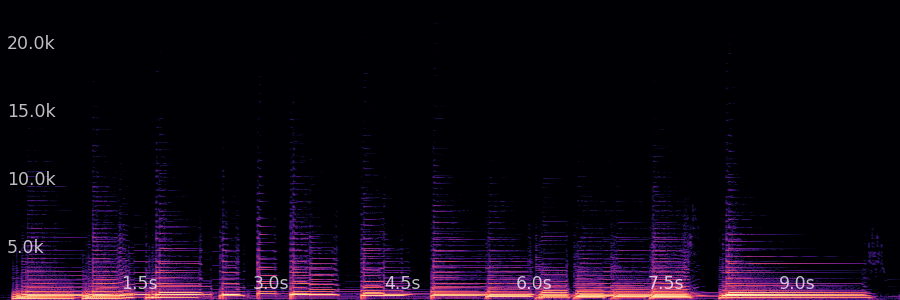
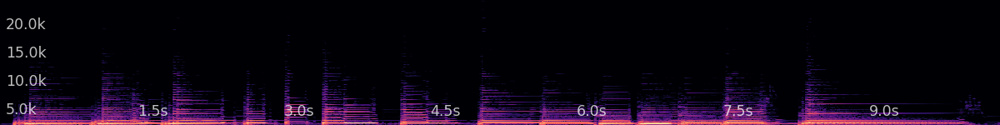

 vs Output: Audealize gnd_truth  duration: 10.243 seconds
batch_size: 1
path: /tmp/tmpqi2gzyez.wav
sample_rate: 44100
num_channels: 1
audio_data.shape: torch.Size([1, 1, 451714])
stft_params: STFTParams(window_length=2048, hop_length=512, window_type='hann', match_stride=False, padding_type='reflect')
device: cpu

38090



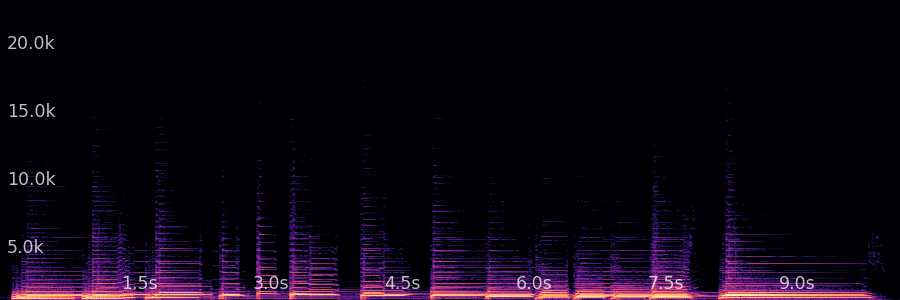
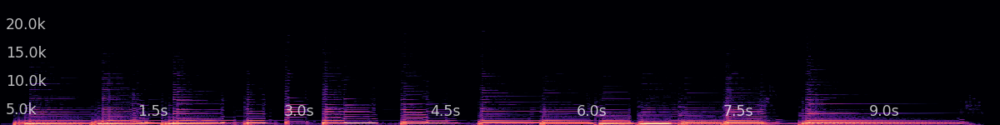

duration: 10.243 seconds
batch_size: 1
path: /tmp/tmpd_mfx2d_.wav
sample_rate: 44100
num_channels: 1
audio_data.shape: torch.Size([1, 1, 451714])
stft_params: STFTParams(window_length=2048, hop_length=512, window_type='hann', match_stride=False, padding_type='reflect')
device: cpu



In [95]:
# are they the same?
print(" Output: DIY EQed ") 
filter_out_m = filter_out.clone().to_mono().normalize()
filter_out_m.widget()
print(" vs Output: Audealize gnd_truth ", filter_out_m )

aud_m = aud.clone().to_mono().resample(filter_out_m.sample_rate).normalize()
offset_samp = np.abs(filter_out_m.shape[-1] - aud_m.shape[-1]) 
print(offset_samp)

aud_m.samples = aud_m.samples[:, :, 7500:filter_out_m.shape[-1]+7500]
aud_m.widget()
print(aud_m)


// auraloss: freq.MultiResolutionSTFTLoss()
tensor(0.4780)

// L1 loss on stfts difference


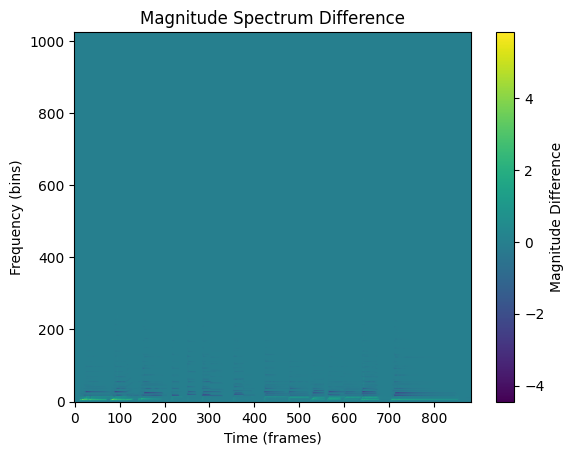

In [96]:
# via aura loss freq.MultiResolutionSTFTLoss()
mrstft = auraloss.freq.MultiResolutionSTFTLoss()
loss = mrstft(aud_m.samples, filter_out_m.samples)
print("// auraloss: freq.MultiResolutionSTFTLoss()")
print(loss)

# via L1 loss (?) on STFT
diff = aud_m.stft().abs() - filter_out_m.stft().abs()

# # Plotting
print("\n// L1 loss on stfts difference")
plt.imshow(diff.squeeze(0).squeeze(0), aspect='auto', origin='lower')
plt.colorbar(label='Magnitude Difference')
plt.xlabel('Time (frames)')
plt.ylabel('Frequency (bins)')
plt.title('Magnitude Spectrum Difference')
plt.show()
# plt.imshow(diff.squeeze(0).squeeze(0))




// Taking closer look
tensor([[  0,   0,   0,  11],
        [  0,   0,   0,  12],
        [  0,   0,   0,  13],
        ...,
        [  0,   0, 419, 427],
        [  0,   0, 420, 154],
        [  0,   0, 443, 154]])


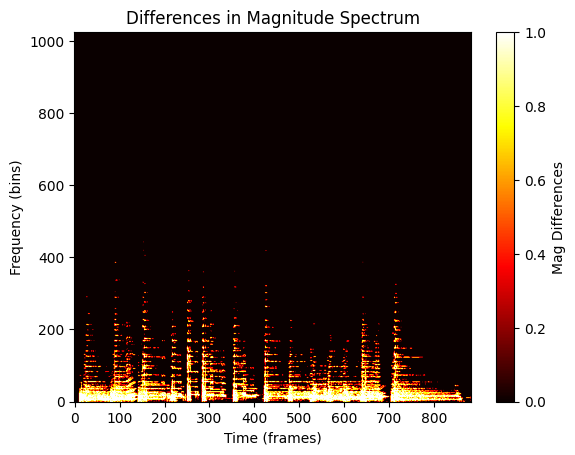

In [68]:
# Closer look, might be due to timing tho?
print("\n// Taking closer look")
threshold = 1e-1
significant_diff_mask = diff.abs() > threshold
significant_diff_indices = torch.nonzero(significant_diff_mask)
print(significant_diff_indices)

# Visualize significant differences
significant_diff_float = significant_diff_mask.float()
plt.imshow(significant_diff_float.squeeze(0).squeeze(0), aspect='auto', origin='lower', cmap='hot')
plt.colorbar(label='Mag Differences')
plt.xlabel('Time (frames)')
plt.ylabel('Frequency (bins)')
plt.title('Differences in Magnitude Spectrum')
plt.show()
